# Morphological causatives in Lev 17-26

In the Hebrew Bible we encounter two types of causatives: 1) The morphological causative (primarily the *Hiphil* stem variation of the *Qal*), and 2) lexical causatives which cannot be derived from a non-causative correspondent. In this notebook we will explore the first of these types.

In [1]:
#Dataset path
PATH = 'datasets/'

import pandas as pd
import collections

#Plotting
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

#Text-fabric
from tf.app import use

In [2]:
A = use('bhsa', hoist=globals())

rate limit is 60 requests per hour, with 60 left for this hour


To increase the rate,see https://annotation.github.io/text-fabric/Api/Repo/


	connecting to online GitHub repo annotation/app-bhsa ... connected
Using TF-app in C:\Users\Ejer/text-fabric-data/annotation/app-bhsa/code:
	rv1.3=#f38d56bd757e87fe12d0c125e1ca52ee4376127b (latest release)
rate limit is 60 requests per hour, with 55 left for this hour


To increase the rate,see https://annotation.github.io/text-fabric/Api/Repo/


	connecting to online GitHub repo etcbc/bhsa ... connected
Using data in C:\Users\Ejer/text-fabric-data/etcbc/bhsa/tf/c:
	rv1.6=#bac4a9f5a2bbdede96ba6caea45e762fe88f88c5 (latest release)
rate limit is 60 requests per hour, with 50 left for this hour


To increase the rate,see https://annotation.github.io/text-fabric/Api/Repo/


	connecting to online GitHub repo etcbc/phono ... connected
Using data in C:\Users\Ejer/text-fabric-data/etcbc/phono/tf/c:
	r1.2=#1ac68e976ee4a7f23eb6bb4c6f401a033d0ec169 (latest release)
rate limit is 60 requests per hour, with 45 left for this hour


To increase the rate,see https://annotation.github.io/text-fabric/Api/Repo/


	connecting to online GitHub repo etcbc/parallels ... connected
Using data in C:\Users\Ejer/text-fabric-data/etcbc/parallels/tf/c:
	r1.2=#395dfe2cb69c261862fab9f0289e594a52121d5c (latest release)
   |     0.00s No structure info in otext, the structure part of the T-API cannot be used


Ten most frequent verbs in *Piel*:

In [3]:
Piel_verbs = '''
word vs=piel|qal
'''
Piel_verbs = A.search(Piel_verbs)

  0.70s 57016 results


In [4]:
Piel_Qal_dict = collections.defaultdict(lambda: collections.defaultdict(int))

for r in Piel_verbs:
    Piel_Qal_dict[F.lex.v(r[0])][F.vs.v(r[0])] += 1
    
verb_list = set()
for v in Piel_Qal_dict:
    if Piel_Qal_dict[v]['qal'] > 10 and Piel_Qal_dict[v]['piel'] > 10:
        verb_list.add(v)

In [5]:
len(verb_list)

47

In [6]:
def reverse_hb(string):
    return string[::-1]

def getLex(string, trans=True):
    
    if trans:
        string = string[string.index('#')+1:string.index('_')]
    else:
        string = string[string.index('_')+1:]
    return string

## Morphological causatives (*Hiphil* and *Qal*)

First, we identify all those verbs occuring in either *Hiphil* or *Piel* in Lev 17-26:

In [7]:
hif_piel = '''
book book=Leviticus
 chapter chapter=17|18|19|20|21|22|23|24|25|26
   clause
     phrase function=Pred|PreS|PreO
      word pdp=verb vs=hif|piel
'''
hif_piel = A.search(hif_piel)

  1.95s 236 results


In [8]:
hif_piel = set([F.lex.v(r[4]) for r in hif_piel])
print(f'There are {len(hif_piel)} verbs in Hiphil and/or Piel in Lev 17-26')

There are 73 verbs in Hiphil and/or Piel in Lev 17-26


We will only look at those with a possible *Qal* derivable. Therefore, we search the corpus (Genesis - Kings) possible for *Qal* correlates:

In [9]:
# prepare the corpus

corpus = [book for book in F.otype.s('book') if book < T.nodeFromSection(('Isaiah',))]
sets={'corpus':corpus} # make set for searching

In [10]:
equiv = '''
corpus
  clause
    phrase function=Pred|PreS|PreO
      word pdp=verb vs=qal|piel|hif lex={}
'''
equiv = A.search(equiv.format('|'.join(list(hif_piel))), sets=sets)

  2.31s 9025 results


For statistical reasons, we will only look at those cases where the verb occurs at least 5 times in each of the stems, that is at least 5 times in Qal and at least 5 times in Piel and/or Hiphil:

In [11]:
stem_frequency = collections.defaultdict(lambda: collections.defaultdict(int))

for r in equiv:
    stem_frequency[F.lex.v(r[3])][F.vs.v(r[3])] += 1

verb_list = []
for v in stem_frequency:
    if stem_frequency[v]['qal'] >= 5 and (stem_frequency[v]['piel'] >= 5 
                                         or stem_frequency[v]['hif'] >= 5):
        verb_list.append(v)
        
print(f'{len(verb_list)} verbs in Lev 17-26 occur at least 5 times in both Qal and Piel/Hiphil in the rest of the corpus')

30 verbs in Lev 17-26 occur at least 5 times in both Qal and Piel/Hiphil in the rest of the corpus


We will look at the *Hiphil* and *Piel* cases in turn. Therefore we use the list just generated to extract the lexemes and stems from the Leviticus-corpus:

In [12]:
hif_piel_Lev = '''
book book=Leviticus
 chapter chapter=17|18|19|20|21|22|23|24|25|26
   clause
     phrase function=Pred|PreS|PreO
      word pdp=verb vs=piel|hif lex={}
'''
hif_piel_Lev = A.search(hif_piel_Lev.format('|'.join(list(verb_list))))

  1.62s 121 results


In [13]:
hiphil = set()
piel = set()

for r in hif_piel_Lev:
    lex = F.lex.v(r[4])
    stem = F.vs.v(r[4])

    if stem in {'hif','hof'} and stem_frequency[lex]['hif'] > 5:
        hiphil.add(lex)
    elif stem in {'piel','pual'} and stem_frequency[lex]['piel'] > 5:
        piel.add(lex)

In [14]:
print(f'There are {len(hiphil)} Hiphil and {len(piel)} Piel to explore')

There are 21 Hiphil and 9 Piel to explore


### *Hiphil*

One way to check if the *Hiphil* is used as a morphological causative is to check whether its transitivity increases, because an increase would often imply an extra agent, possibly a causer. We can check this by collecting all instances of the lexeme in qal and hiphil and compute the transitivity frame for each instance.

We explore the patterns within our corpus (Genesis - Kings):

We define a set of transitivity or valency patterns to filter the lexeme instances:

In [15]:
# Monovalent or avalent frame without object and complement. Subject may be implicit or explicit.
avalent_monovalent = '''
corpus
 clause
 /without/
    phrase function=Objc|Cmpl
 /-/
   phrase function=Pred|PreS
     word lex={} vs={}
'''

#Divalent frame with complement and no object
divalent1 = '''
corpus
 clause
 /without/
   phrase function=Objc
 /-/
   phrase function=Pred|PreS
     word lex={} vs={}
   phrase function=Cmpl 
'''

#Divalent frame with object suffix and no lexical object and complement.
divalent2 = '''
corpus
 clause
 /without/
   phrase function=Objc|Cmpl
 /-/
   phrase function=PreO
     word lex={} vs={}
'''

#Divalent frame with lexical object and no complement
divalent3 = '''
corpus
 clause
 /without/
   phrase function=Cmpl
 /-/
 /without/
   phrase function=Objc
   > phrase function=Objc
 /-/ 
   phrase function=Pred|PreS
     word lex={} vs={}
   phrase function=Objc
'''

#Trivalent frame with one lexical object and complement
trivalent1 = '''
corpus
 clause
 /without/
   phrase function=Objc
   > phrase function=Objc
 /-/
   phrase function=Pred|PreS
     word lex={} vs={}
   phrase function=Cmpl
   phrase function=Objc
'''

#Trivalent frame with one object suffix and lexical complement
trivalent2 = '''
corpus
 clause
 /without/
   phrase function=Objc
 /-/
 /without/
   phrase function=Objc
   > phrase function=Objc
 /-/
   phrase function=PreO
     word lex={} vs={}
   phrase function=Cmpl
'''

#Trivalent frame with double object, both lexical
trivalent3 = '''
corpus
 clause
 /without/
    phrase function=Cmpl
 /-/
    phrase function=Pred|PreS
      word lex={} vs={}
    phrase function=Objc
    > phrase function=Objc
'''

#Trivalent frame with double object, one being suffix
trivalent4 = '''
corpus
 clause
 /without/
    phrase function=Cmpl
 /-/
    phrase function=PreO
      word lex={} vs={}
    phrase function=Objc
'''

#Tetravalent frame with double object and complement
tetravalent1 = '''
corpus
 clause
    phrase function=Pred|PreS
      word lex={} vs={}
    phrase function=Objc
    > phrase function=Objc
    phrase function=Cmpl
'''

#Tetravalent frame with double object, one being suffix, and complement
tetravalent2 = '''
corpus
 clause
    phrase function=PreO
      word lex={} vs={}
    phrase function=Objc
    phrase function=Cmpl
'''

In [16]:
frames = {'(S)':avalent_monovalent, '(S)-C':divalent1, '(S)-O_sfx':divalent2, '(S)-O':divalent3, '(S)-O-C':trivalent1,
          '(S)-O_sfx-C':trivalent2, '(S)-O-O':trivalent3, '(S)-O-O_sfx':trivalent4, '(S)-O-O-C':tetravalent1,
         '(S)-O-O_sfx-C':tetravalent2}

stems = 'qal|hif'

lexemes = '|'.join(hiphil)


verb_constructions = {}

n=0
for fr in frames:
    
    clause = ''
    lex = ''
    stem = ''
    
    results = A.search(frames[fr].format(lexemes, stems), sets=sets, silent=True)
    
    for r in results:
        
        clause = r[1]
        heb = F.lex_utf8.v(r[3])
        lex = F.lex.v(r[3])
        gloss = F.gloss.v(L.u(r[3], 'lex')[0])
        verb = f'{heb}#{lex}_{gloss}'
        stem = F.vs.v(r[3])
        
        verb_constructions[clause] = [verb, stem, fr]
            
    n+=1
    print(f'... frame {n} completed')

... frame 1 completed
... frame 2 completed
... frame 3 completed
... frame 4 completed
... frame 5 completed
... frame 6 completed
... frame 7 completed
... frame 8 completed
... frame 9 completed
... frame 10 completed


#### Creating dataframe

In [17]:
hif_df = pd.DataFrame(verb_constructions).T
hif_df.columns = ['lex','stem','frame']
hif_df.head()

,lex,stem,frame
427633,רבה#RBH[_be many,qal,(S)
427635,רבה#RBH[_be many,qal,(S)
427658,רבה#RBH[_be many,qal,(S)
427738,מות#MWT[_die,qal,(S)
427781,מות#MWT[_die,qal,(S)


#### Evaluating data extraction

In [18]:
all_cases = '''
corpus
 clause
  phrase function=Pred|PreO|PreS
   word lex={} sp=verb vs=qal|hif
'''

results_all_cases = A.search(all_cases.format(lexemes), sets=sets)

  1.34s 5834 results


In [19]:
all_clauses = [r[1] for r in results_all_cases]

error_list = []

for cl in all_clauses:
    if cl not in hif_df.index:
        error_list.append(cl)
        
print(f'Number of missing cases: {len(error_list)}')

Number of missing cases: 0


#### Simplifying the dataset

We combine some of the frames in order not to distinguish between lexical and suffix object. That will probably give a clearer picture of the general tendency. First we cross-tabulate lex, stem and frame:

In [20]:
df_frequency = pd.crosstab(index=[hif_df.lex, hif_df.stem], columns=hif_df.frame)

#Column total:
df_frequency['total'] = df_frequency.sum(axis=1)
df_frequency.head()

frame                 (S)  (S)-C  (S)-O  (S)-O-C  (S)-O-O  (S)-O-O-C  \
lex             stem                                                   
אבד#>BD[_perish hif     0      0      4        2        0          0   
                qal    13      9      0        0        0          0   
בוא#BW>[_come   hif     8     32     28      118        4          2   
                qal   272    706      1        0        0          0   
הלך#HLK[_walk   hif     0      1      4        8        0          1   

frame                 (S)-O-O_sfx  (S)-O-O_sfx-C  (S)-O_sfx  (S)-O_sfx-C  \
lex             stem                                                       
אבד#>BD[_perish hif             0              0          4            0   
                qal             0              0          0            0   
בוא#BW>[_come   hif             1              1         13           48   
                qal             0              0          0            0   
הלך#HLK[_walk   hif             0              0          1            0   

frame                 total  
lex             stem         
אבד#>BD[_perish hif      10  
                qal      22  
בוא#BW>[_come   hif     255  
                qal     979  
הלך#HLK[_walk   hif      15

We now reduce the number of frames by combining them:

In [21]:
update_columns = [('(S)','(S)-C'),
                  ('(S)-O','(S)-O_sfx','(S)-O-C','(S)-O_sfx-C'),
                  ('(S)-O-O','(S)-O-O_sfx','(S)-O-O-C','(S)-O-O_sfx-C')
                 ]

for c in update_columns:
    retain_col = c[0]
    copy_col = c[1:]
    
    for d in copy_col:
        new_col = df_frequency[retain_col] + df_frequency[d]
       
        #Dropping columns:
        df_frequency = df_frequency.drop([retain_col,d], axis=1)
    
        #Add new column:
        df_frequency[retain_col] = new_col

In [22]:
df_frequency = df_frequency[['(S)','(S)-O','(S)-O-O','total']]

In [23]:
df_frequency.head()

frame                 (S)  (S)-O  (S)-O-O  total
lex             stem                            
אבד#>BD[_perish hif     0     10        0     10
                qal    22      0        0     22
בוא#BW>[_come   hif    40    207        8    255
                qal   978      1        0    979
הלך#HLK[_walk   hif     1     13        1     15

#### Plotting tendencies

In [24]:
def genTendency(df, stem1, stem2, title, col_order, colormap='blue', ylim=50):
    
    #Isolating qal
    stem1_df = df.loc[df.index.get_level_values(1) == stem1]
    stem1_prop = stem1_df.sum() / stem1_df.sum().total * 100

    #Isolating hiphil
    stem2_df = df.loc[df.index.get_level_values(1) == stem2]
    stem2_prop = stem2_df.sum() / stem2_df.sum().total * 100
    
    fig, ax = plt.subplots()
    fig.canvas.draw()

    h1 = plt.bar(col_order, stem1_prop.reindex(col_order), color=colormap, alpha=(0.6))
    h2 = plt.bar(col_order, -stem2_prop.reindex(col_order), color=colormap, alpha=(0.3))
    
    #Title
    plt.title(title, pad=15, fontsize=24)

    #Axes
    plt.ylim(-ylim,ylim)
    ytick_labels = [x if x > 0 else -x for x in range(-ylim,ylim+1,10)]
    plt.yticks(range(-ylim,ylim+1,10), ytick_labels, fontsize=16)  
    plt.ylabel('%', fontsize=20, rotation = 0)
    plt.xticks(fontsize=16, rotation=15)
    plt.axhline(0, color='gray')

    #Legend:
    intrans = mpatches.Patch(color='red', alpha=(0.6), label='Intransitive')
    trans = mpatches.Patch(color='blue', alpha=(0.6), label='Transitive')
    ditrans = mpatches.Patch(color='green', alpha=(0.6), label='Ditransitive')
    plt.legend(handles=[intrans, trans, ditrans], fontsize=14, loc='lower center', ncol=3, frameon=False)

    #Text
    plt.text(0, stem1_prop.reindex(col_order)[0]+4, stem1, size=14,
             ha="center", va="center")

    plt.text(0, -stem2_prop.reindex(col_order)[0]-4, stem2, size=14,
             ha="center", va="center")

    plt.rcParams["figure.figsize"] = (15,7)
    plt.show()

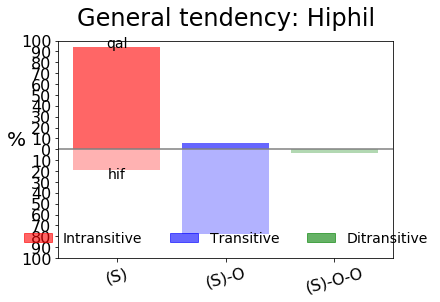

In [25]:
colormap = ['red','blue','green']
col_order = ['(S)','(S)-O','(S)-O-O']

genTendency(df_frequency, 'qal','hif',"General tendency: Hiphil", col_order, colormap, ylim=100)

In short, we see a strong tendency of transitivity increase in the *Hiphil*.

#### Plotting increasing transitivity

We want to compute a degree of transitivity increase, so that both intransitive and transitive verbs can be equally accounted for.

We begin by compute a dateframe with the ratio of all alternations between *Qal* and *Hiphil*. The ratio is computed by multiplying each *Qal* column with each *Hiphil* column. The alterantion ratio is hypothezized as the result of the proportion in *Qal* and the proportion in *Hiphil*, that is, Qal x Hiphil. A high proportion of, e.g., *Qal* intransitive and *Hiphil* transitive would result in a high ratio, e.g.:

Qal_intrans (50%) x Hiphil trans (75%) = 37,5%

In [26]:
def alternations(df, stems=('qal','hif')):
    
    #Creating a proportional table of the dataframe (column-wise)
    prop_table = df.div(df.total, axis=0)
    
    prop_table = prop_table.drop('total', axis=1) #The total-column is dropped
    prop_table.columns = [col + '_' for col in prop_table.columns] #Adding '_' to the name of each column
    prop_table = prop_table.unstack(level=[1]) #Unstacking table
    
    #The columns are combined with the stem:
    prop_table.columns = pd.Series(prop_table.columns.tolist()).apply(pd.Series).sum(axis=1)
    prop_table = round(prop_table, 6)
    
    ### Each 'qal' column is multiplied by each of the non-qal columns:
    comb_df = pd.DataFrame() #Data is added to empty dataframe
    
    stem1_columns = [col for col in prop_table.columns if col[-len(stems[0]):] == stems[0]]
    stem2_columns = [col for col in prop_table.columns if col[-len(stems[1]):] == stems[1]]
    
    for col1 in stem1_columns:
        for col2 in stem2_columns:
            new_col_name = f'{col1}_TO_{col2}'
            comb_df[new_col_name] = prop_table[col1] * prop_table[col2]
    
    return comb_df

In [27]:
qal_hif = alternations(df_frequency)
qal_hif.head()

,(S)_qal_TO_(S)_hif,(S)_qal_TO_(S)-O_hif,(S)_qal_TO_(S)-O-O_hif,(S)-O_qal_TO_(S)_hif,(S)-O_qal_TO_(S)-O_hif,(S)-O_qal_TO_(S)-O-O_hif,(S)-O-O_qal_TO_(S)_hif,(S)-O-O_qal_TO_(S)-O_hif,(S)-O-O_qal_TO_(S)-O-O_hif
lex,,,,,,,,,
אבד#>BD[_perish,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
בוא#BW>[_come,0.156703,0.810936,0.031341,0.000160,0.000829,0.000032,0.000000,0.000000,0.000000
הלך#HLK[_walk,0.066246,0.861196,0.066246,0.000337,0.004378,0.000337,0.000084,0.001095,0.000084
חזק#XZQ[_be strong,0.853659,0.121951,0.000000,0.021341,0.003049,0.000000,0.000000,0.000000,0.000000
ילד#JLD[_bear,0.019886,0.308239,0.000000,0.040720,0.631155,0.000000,0.000000,0.000000,0.000000


We can group the columns according to whether the columns contain alternations toward increasing transitivity. The columns are:

In [28]:
def greaterTransitivity(stem):
    intrans = ['(S)']
    trans = ['(S)-O']
    ditrans = ['(S)-O-O']

    alternation_list = []

    #from intrans
    for k in intrans:
        for l in trans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

        for l in ditrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

    #from trans
    for k in trans:
        for l in ditrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')    

    return alternation_list

def lesserTransitivity(stem):
    intrans = ['(S)']
    trans = ['(S)-O']
    ditrans = ['(S)-O-O']

    alternation_list = []

    #from ditrans
    for k in ditrans:
        for l in trans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

        for l in intrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

    #from trans
    for k in trans:
        for l in intrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')    

    return alternation_list

In [29]:
greater_trans = greaterTransitivity('hif')
greater_trans

['(S)_qal_TO_(S)-O_hif', '(S)_qal_TO_(S)-O-O_hif', '(S)-O_qal_TO_(S)-O-O_hif']

In [30]:
lesser_trans = lesserTransitivity('hif')
lesser_trans

['(S)-O-O_qal_TO_(S)-O_hif', '(S)-O-O_qal_TO_(S)_hif', '(S)-O_qal_TO_(S)_hif']

We can sum up the means for each of these three columns. There is 60% change for an average lexeme in the dataset to increase in transitivity when alterning from *Qal* to *Hiphil*:

In [31]:
qal_hif[greater_trans].mean().sum()

0.6788071863175715

There is about 2% chance that an average lexeme will decrease in transitivity:

In [32]:
qal_hif[lesser_trans].mean().sum()

0.029502538659238096

And, finally, about there is 32% chance that there is neither decrease or increase when alternating between *Hiphil* and *Qal*:

In [33]:
no_alter = qal_hif[['(S)_qal_TO_(S)_hif','(S)-O_qal_TO_(S)-O_hif','(S)-O-O_qal_TO_(S)-O-O_hif']].mean().sum()
no_alter

0.29169041788038097

In total, all three alternation types should account for 100% of the proportions:

In [34]:
qal_hif[greater_trans].mean().sum() + qal_hif[lesser_trans].mean().sum() + no_alter

1.0000001428571905

We now turn our attention toward individual words and their alternation schemes. If we compute the total ratio of transitivity increase as the proportion of increase minus the proportion of decrease (while disregarding the no-alternation pattern), we get the table below:

In [35]:
qal_hif_trans = qal_hif[greater_trans + lesser_trans]

#We create two new columns, one for the sum of greater transitivity and one for the sum of lesser:
qal_hif_trans.insert(6, 'increase', list(qal_hif_trans[greater_trans].sum(axis=1)))
qal_hif_trans.insert(7, 'decrease', list(qal_hif_trans[lesser_trans].sum(axis=1)))

#The two new columns are summed by treating the decrease column as negative:
qal_hif_trans.insert(8, 'total', qal_hif_trans['increase']-qal_hif_trans['decrease'])
qal_hif_trans = qal_hif_trans.sort_values(by='total', ascending=False)
qal_hif_trans

,(S)_qal_TO_(S)-O_hif,(S)_qal_TO_(S)-O-O_hif,(S)-O_qal_TO_(S)-O-O_hif,(S)-O-O_qal_TO_(S)-O_hif,(S)-O-O_qal_TO_(S)_hif,(S)-O_qal_TO_(S)_hif,increase,decrease,total
lex,,,,,,,,,
אבד#>BD[_perish,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
קום#QWM[_arise,0.949367,0.012658,0.000000,0.000000,0.000000,0.000000,0.962025,0.000000,0.962025
שׁוב#CWB[_return,0.801418,0.127660,0.000000,0.000000,0.000000,0.000000,0.929078,0.000000,0.929078
הלך#HLK[_walk,0.861196,0.066246,0.000337,0.001095,0.000084,0.000337,0.927779,0.001516,0.926263
יצא#JY>[_go out,0.908092,0.000000,0.000000,0.000000,0.000000,0.000826,0.908092,0.000826,0.907266
מות#MWT[_die,0.902174,0.000000,0.000000,0.000000,0.000000,0.000000,0.902174,0.000000,0.902174
קרב#QRB[_approach,0.824324,0.033784,0.000000,0.000000,0.000000,0.000000,0.858108,0.000000,0.858108
שׁבת#CBT[_cease,0.857143,0.000000,0.000000,0.000000,0.000000,0.000000,0.857143,0.000000,0.857143
עלה#<LH[_ascend,0.817062,0.038541,0.000219,0.000000,0.000000,0.000788,0.855822,0.000788,0.855034


In [36]:
#Extract example:

round(qal_hif_trans[qal_hif_trans.index.isin(['HLK[_walk', 'JLD[_bear'])].T, 3)

lex
(S)_qal_TO_(S)-O_hif
(S)_qal_TO_(S)-O-O_hif
(S)-O_qal_TO_(S)-O-O_hif
(S)-O-O_qal_TO_(S)-O_hif
(S)-O-O_qal_TO_(S)_hif
(S)-O_qal_TO_(S)_hif
increase
decrease
total


We can now plot the average alternation pattern for each of the lexeme in question:

In [37]:
def plotTrans(df, title, column='total', threshold=float, label='comb', highlight=list()):
    
    ax = plt.bar(df.index, df[column]*100, color=(df[column] > 0.5).map({True: 'darkblue', False: 'r'}), alpha=0.3)
    
    if label == 'gloss':
        xaxis = [v[v.index('_')+1:] for v in list(df.index)]
        plt.xticks(df.index, xaxis, rotation=25, size=14, ha='right')
    elif label == 'heb':
        xaxis = reverse_hb([v[:v.index('_')] for v in list(df.index)])
        plt.xticks(df.index, xaxis, rotation=25, size=14, fontname = "Times New Roman")
    elif label == 'trans':
        xaxis = [v[:v.index("_")] for v in list(df.index)]
        plt.xticks(df.index, xaxis, rotation=25, size=12)
    elif label == 'comb':
        xaxis = [f'{reverse_hb(v[:v.index("#")])} {v[v.index("_")+1:]}'.replace('[','') for v in list(df.index)]
        plt.xticks(df.index, xaxis, rotation=25, size=12, horizontalalignment="right")   
        
    plt.title(title, size=18)

    plt.yticks(size=14)
    plt.ylabel('%', size=16)
    plt.axhline(0, color='grey', linewidth=1)
    
    if threshold:
        plt.axhline(threshold, color='grey', linewidth=1, linestyle='--')
                                                                      
    if highlight:
        if not 'lexeme' in df.columns:
            df.insert(0, 'lexeme', [lex[lex.index("#")+1:lex.index("_")] for lex in list(df.index)])                                            
        for n in range(len(df)):
            if df.iloc[n].lexeme in highlight:
                ax[n].set_alpha(1.0)

    plt.show()

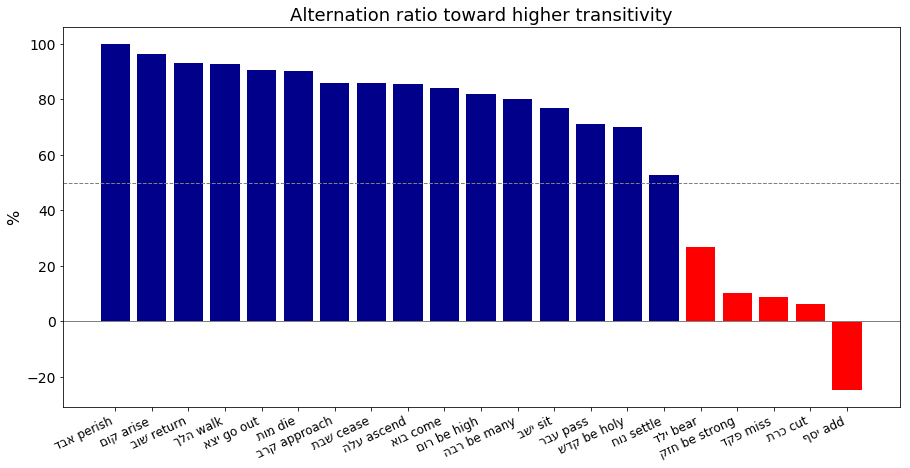

In [38]:
plotTrans(qal_hif_trans, title='Alternation ratio toward higher transitivity', threshold=50, label='comb', highlight=hiphil)

The majority of the lexemes show a clear tendency toward greater transitivity when alternating from *Qal* to *Hiphil*. A few show a miner tendency toward greater transitivty, while יסף "add" show a negative tendency.

We hypothesize that lexemes with a high ratio are more likely to be causatives than lexemes with a low or negative ratio. We chosse 0.5 as threshold. Lexemes with a ratio higher than 0.5 will increase in transitivity in more than 50% of the cases and may therefore reasonable be morphological causatives. On the other hand, lexemes with a ratio lower than 0.5 are more likely not to increase in transitivity. These lexemes may in fact be causatives, but in that case most likely lexical causatives.

In [39]:
hif_causatives = list(qal_hif_trans[qal_hif_trans.total > 0.5].index)
hif_not_causatives = list(qal_hif_trans[~qal_hif_trans.index.isin(hif_causatives)].index)

#### Causatives

We evaluate each of the lexemes with respect to their occurences in Lev 17-26. If the actual use in that corpus does not support the annotation decided above, it is changed manually by adding the correction to the following dictionary. We also check the lexemes in *Hophal*, which is the presumed passive of *Hiphil*.

In [40]:
correction = {}

In [41]:
query = '''
book book=Leviticus
 chapter chapter=17|18|19|20|21|22|23|24|25|26
  clause
   phrase function=Pred|PreO|PreS
    word lex={} vs={}
'''

def display(lex, stem='qal|hif'):
    lex = lex[lex.index('#')+1:lex.index('_')]
    results = A.search(query.format(lex, stem))
    A.show(results)
    
query_corpus = '''
corpus
 clause
   phrase function=Pred|PreS|PreO
     word lex={} vs={}
'''

def displayCorpus(lex, stem='qal', s=1, n=5):
    results = A.search(query_corpus.format(lex, stem), sets=sets)
    A.show(results, start=s, end=n)

##### >BD "perish"

In [42]:
display(hif_causatives[0])

  1.05s 2 results


The annotation can be retained. Curiously, one would expect >BD to be a stative verb, while *Hiphil* is typically used of active verbs in contrast to *Piel* that is frequent with stative verbs.

In [43]:
displayCorpus('>BD[', stem='piel', s=1, n=10)

  1.25s 9 results


##### Q>M "arise"

In [44]:
display(hif_causatives[1])

  1.17s 4 results


In [45]:
displayCorpus('QWM[', stem='qal', s=1, n=10)

  1.28s 260 results


The annotation can be retained

##### CWB "return"

In [46]:
display(hif_causatives[2])

  1.16s 13 results


The annotation can be retained

##### HLK "walk"

In [47]:
display(hif_causatives[3])

  1.34s 13 results


The annotation can be retained.

##### JY> "go out"

In [48]:
display(hif_causatives[4])

  1.34s 19 results


The annotation can be retained.

##### MWT "die"

In [49]:
display(hif_causatives[5])

  1.20s 3 results


In [50]:
displayCorpus('MWT[', stem='hif')

  1.43s 92 results


The annotation can be retained.

##### QRB "approach"

In [51]:
display(hif_causatives[6])

  1.51s 26 results


The annotation can be retained

##### CBT "cease"

In [52]:
display(hif_causatives[7])

  1.44s 6 results


In [53]:
displayCorpus('CBT[', stem='hif', s=1, n=10)

  1.41s 8 results


The annotation can be retained although the relationship between the *Qal* and the *Hiphil* is not entirely clear. The *Qal* verb is sometimes transitive, meaning "keep the sabbath", and sometimes intransitive, "to rest". The one *Hiphil* example is best translated "keep away" which is causative. In short, the *Hiphil* is causative, while the *Qal* is not. 

##### <LH "ascend"

In [54]:
display(hif_causatives[8])

  1.25s 3 results


In [55]:
displayCorpus('<LH[', stem='hif', s=30, n=50)

  1.30s 129 results


While the semantic relationship between the *Qal* and the *Hiphil* uses are not totally corresponding, one can regard the *Qal* meaning as "to ascend" while the *Hiphil* is used as "lid/set on fire". The annotation should therefore be changed to none-causative.

In [56]:
correction['<LH['] = (('qal',''),('hif',''))

##### BW> "come"

In [57]:
display(hif_causatives[9])

  1.44s 21 results


The annotation can be retained.

##### RWM "be high"

In [58]:
display(hif_causatives[10])

  1.25s 1 result


In [59]:
displayCorpus('RWM[')

  1.28s 7 results


The annotation can be retained. Although the Leviticus-case has a technical meaning of sacrificing, it can still be parsed as causative.

##### RBH "be many"

In [60]:
display(hif_causatives[11])

  1.23s 2 results


In [61]:
displayCorpus('RBH[')

  1.28s 31 results


The annnotation can be retained.

##### JCB "sit"

In [62]:
display(hif_causatives[12])

  1.17s 9 results


In [63]:
displayCorpus('LJN[', stem='qal')

  1.23s 36 results


The annotation can be retained.

##### <BR "pass"

In [64]:
display(hif_causatives[13])

  1.12s 4 results


The *Hiphil* verbs are difficult to parse because they are used in quite different ways. All of them, however, seem to be causative. In Lev 18:21 the verb is certainly causative, if the referent is the subject from the preceding clause. In short, we can retain the annotation.

##### QDC "be holy"

In [65]:
display(hif_causatives[14])

  1.22s 1 result


In [66]:
displayCorpus('QDC[', s=5, n=10)

  1.27s 9 results


The annotation can be retained. In many cases the object of QDC *Hiphil* can be inferred from a relative particle or from the context. Nevertheless, the *Hiphil* seems to be used for an activity causing something to be holy.

##### NWX "settle"

In [67]:
display(hif_causatives[15])

  1.16s 1 result


In [68]:
displayCorpus('CKN[', stem='piel')

  1.14s 7 results


In sum, we have retained all causatives in this section apart from <LH "ascend"

#### Not causatives

We now more on to the lexemes that have a weaker tendency toward greater transitivy, that is, less than 50% chance. We assume that the lexemes in this category are neither causative in the *Qal* or the *Hiphil*. If the data proves otherwise, we will make manual corrections.

##### JLD "bear"

In [69]:
display(hif_not_causatives[0])

  1.28s 1 result


In [70]:
displayCorpus('JLD[', stem='hif')

  1.22s 66 results


In [71]:
correction['JLD['] = (('qal','caus'),('hif','caus'))

The *Hiphil* is often used of males while the *Qal* is often used of females. In both cases, the event implies causation of existence.

##### XZQ "be strong"

In [72]:
display(hif_not_causatives[1])

  1.17s 1 result


In [73]:
displayCorpus('XZQ[', stem='hif', s=11, n=15)

  1.27s 24 results


The *Hiphil* can sometimes be used as a caustive in the sense of "strengthen" (e.g. 2 Sam 11:25), but most frequently it is used with the preposition B and means "seize/grasp", a less prototypical causative.

In [74]:
correction['XZQ['] = (('qal',''),('hif','caus'))

##### PQD "miss"

In [75]:
display(hif_not_causatives[2])

  1.08s 2 results


In [76]:
displayCorpus('PQD[', 'qal')

  1.27s 59 results


The two cases are strikingly similar. In both the *Qal* and the *Hiphil* case, there is a direct object and a complement with על "against" indicating the target. None of the cases seem to be causative but denote a simple event.

##### KRT "cut"

In [77]:
display(hif_not_causatives[3])

  1.08s 6 results


In [78]:
displayCorpus('KRT[', stem='hif')

  1.20s 28 results


The *Qal* is often used to describe the initation of a covenant, but may also be used in cases of extermination and removal, just like the *Hiphil*. Therefore, *Hiphil* should not be regarded as a morphological causative of *Qal*. The *Hiphil* is certainly causative, and the *Qal* may in many cases also be causative.

In [79]:
correction['KRT['] = (('qal','?'),('hif','caus'))

##### JSP "add"

In [80]:
display(hif_not_causatives[4])

  1.23s 4 results


All cases seem to be causative, albeit in different ways.

In [81]:
correction['JSP['] = (('qal','caus'),('hif','caus'))

So far, we have made 6 corrections:

In [82]:
correction

{'<LH[': (('qal', ''), ('hif', '')),
 'JLD[': (('qal', 'caus'), ('hif', 'caus')),
 'XZQ[': (('qal', ''), ('hif', 'caus')),
 'KRT[': (('qal', '?'), ('hif', 'caus')),
 'JSP[': (('qal', 'caus'), ('hif', 'caus'))}

### *Piel*

We now move on to *Piel* which may also sometimes be used as a causative or a factitive. We will explore, whether the same tendency for greater transitivity to indicate causativity holds for *Piel*.

What about the most frequent verbs in Qal and Piel, occuring at least 5 times in both Qal and Piel? 

In [83]:
query1 = '''
corpus
  phrase function=Pred|PreS|PreO
    word pdp=verb vs=qal|piel
'''

results1 = A.search(query1, sets=sets)

  1.66s 25342 results


In [84]:
all_piel = collections.defaultdict(lambda: collections.defaultdict(int))

for r in results1:
    all_piel[F.lex.v(r[2])][F.vs.v(r[2])] += 1

all_piel_verbs = []
for v in all_piel:
    if all_piel[v]['qal'] > 5 and all_piel[v]['piel'] > 5:
        all_piel_verbs.append(v)
        
#all_piel_verbs

How large proportion of the possible Piel morphological causatives do we explore?

In [85]:
def getFrequency(verb_list, stem='qal|piel'):
    
    verb_list = '|'.join(verb_list)
    results = A.search(query_corpus.format(verb_list, stem), sets=sets, silent=True)
    return len(results)

In [86]:
piel = list(piel) #Piel verbs in Lev 17-26
print(getFrequency(piel))
print(getFrequency(all_piel_verbs))

897
1482


In [87]:
print(f'{round(getFrequency(piel)/getFrequency(all_piel_verbs)*100, 2)}%')

60.53%


In [88]:
frames = {'(S)':avalent_monovalent, '(S)-C':divalent1, '(S)-O_sfx':divalent2, '(S)-O':divalent3, '(S)-O-C':trivalent1,
          '(S)-O_sfx-C':trivalent2, '(S)-O-O':trivalent3, '(S)-O-O_sfx':trivalent4, '(S)-O-O-C':tetravalent1,
         '(S)-O-O_sfx-C':tetravalent2}

stems = 'qal|piel'

lexemes = '|'.join(all_piel_verbs)

verb_constructions = {}

n=0
for fr in frames:
    
    clause = ''
    lex = ''
    stem = ''
    
    results = A.search(frames[fr].format(lexemes, stems), sets=sets, silent=True)
    
    for r in results:
        
        clause = r[1]
        heb = F.lex_utf8.v(r[3])
        lex = F.lex.v(r[3])
        gloss = F.gloss.v(L.u(r[3], 'lex')[0])
        verb = f'{heb}#{lex}_{gloss}'
        stem = F.vs.v(r[3])
        
        verb_constructions[clause] = [verb, stem, fr]
            
    n+=1
    print(f'... frame {n} completed')

... frame 1 completed
... frame 2 completed
... frame 3 completed
... frame 4 completed
... frame 5 completed
... frame 6 completed
... frame 7 completed
... frame 8 completed
... frame 9 completed
... frame 10 completed


#### Creating dataframe

In [89]:
piel_df = pd.DataFrame(verb_constructions).T
piel_df.columns = ['lex','stem','frame']
piel_df.head()

,lex,stem,frame
427870,חיה#XJH[_be alive,qal,(S)
427984,חיה#XJH[_be alive,qal,(S)
427991,חיה#XJH[_be alive,qal,(S)
427993,חיה#XJH[_be alive,qal,(S)
427995,חיה#XJH[_be alive,qal,(S)


#### Evaluating data extraction

In [90]:
all_cases = '''
corpus
 clause
  phrase function=Pred|PreO|PreS
   word lex={} sp=verb vs=qal|piel
'''

results_all_cases = A.search(all_cases.format(lexemes), sets=sets)

  1.37s 1482 results


In [91]:
all_clauses = [r[1] for r in results_all_cases]

error_list = []

for cl in all_clauses:
    if cl not in piel_df.index:
        error_list.append(cl)
        
print(f'Number of missing cases: {len(error_list)}')

Number of missing cases: 0


#### Simplifying the dataset

We combine some of the frames in order not to distinguish between lexical and suffix object. That will probably give a clearer picture of the general tendency. First we cross-tabulate lex, stem and frame:

In [92]:
df_frequency = pd.crosstab(index=[piel_df.lex, piel_df.stem], columns=piel_df.frame)

#Column total:
df_frequency['total'] = df_frequency.sum(axis=1)
df_frequency.head()

frame                    (S)  (S)-C  (S)-O  (S)-O-C  (S)-O-O  (S)-O-O-C  \
lex                stem                                                   
אבד#>BD[_perish    piel    1      0      4        1        0          0   
                   qal    13      9      0        0        0          0   
בער#B<R[_burn      piel    2      3      4       15        0          0   
                   qal     2      4      0        0        0          0   
גדל#GDL[_be strong piel    1      0      3        1        0          0   

frame                    (S)-O-O_sfx  (S)-O-O_sfx-C  (S)-O_sfx  (S)-O_sfx-C  \
lex                stem                                                       
אבד#>BD[_perish    piel            0              0          3            0   
                   qal             0              0          0            0   
בער#B<R[_burn      piel            0              0          0            0   
                   qal             0              0          0            0   
גדל#GDL[_be strong piel            0              0          0            1   

frame                    total  
lex                stem         
אבד#>BD[_perish    piel      9  
                   qal      22  
בער#B<R[_burn      piel     24  
                   qal       6  
גדל#GDL[_be strong piel      6

We now reduce the number of frames by combining them:

In [93]:
update_columns = [('(S)','(S)-C'),
                  ('(S)-O','(S)-O_sfx','(S)-O-C','(S)-O_sfx-C'),
                  ('(S)-O-O','(S)-O-O_sfx','(S)-O-O-C')#,'(S)-O-O_sfx-C')
                 ]

for c in update_columns:
    retain_col = c[0]
    copy_col = c[1:]
    
    for d in copy_col:
        new_col = df_frequency[retain_col] + df_frequency[d]
       
        #Dropping columns:
        df_frequency = df_frequency.drop([retain_col,d], axis=1)
    
        #Add new column:
        df_frequency[retain_col] = new_col

In [94]:
df_frequency = df_frequency[['(S)','(S)-O','(S)-O-O','total']]

In [95]:
df_frequency.head()

frame                    (S)  (S)-O  (S)-O-O  total
lex                stem                            
אבד#>BD[_perish    piel    1      8        0      9
                   qal    22      0        0     22
בער#B<R[_burn      piel    5     19        0     24
                   qal     6      0        0      6
גדל#GDL[_be strong piel    1      5        0      6

#### Plotting tendencies

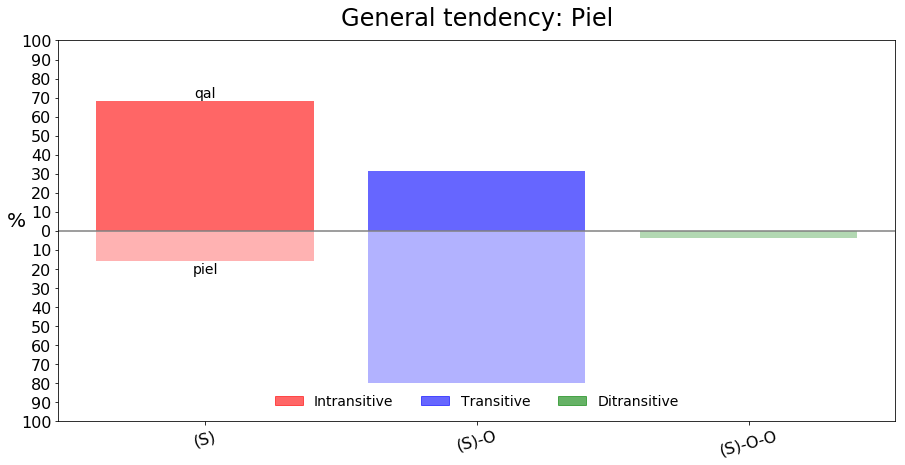

In [96]:
colormap = ['red','blue','green']
col_order = ['(S)','(S)-O','(S)-O-O']

genTendency(df_frequency, 'qal','piel',"General tendency: Piel", col_order, colormap, ylim=100)

In short, we do not see a general tendency toward higher transitivity for the *Piel* stem. Quite the opposite, the *Qal* is apparently more associated with transitivity than the *Piel*. However, the individual lexemes may display important variations.

#### Plotting increasing transitivity

We want to compute a degree of transitivity increase, so that both intransitive and transitive verbs can be equally accounted for. We use the following function to create a dataframe where the ratio of each alternation between *Qal* and *Piel* is computed.

In [97]:
def alternations(df, stems=('qal','hif')):
    
    #Creating a proportional table of the dataframe (column-wise)
    prop_table = df.div(df.total, axis=0)
    
    prop_table = prop_table.drop('total', axis=1) #The total-column is dropped
    prop_table.columns = [col + '_' for col in prop_table.columns] #Adding '_' to the name of each column
    prop_table = prop_table.unstack(level=[1]) #Unstacking table
    
    #The columns are combined with the stem:
    prop_table.columns = pd.Series(prop_table.columns.tolist()).apply(pd.Series).sum(axis=1)
    prop_table = round(prop_table, 6)
    
    ### Each 'qal' column is multiplied by each of the non-qal columns:
    comb_df = pd.DataFrame() #Data is added to empty dataframe
    
    stem1_columns = [col for col in prop_table.columns if col[-len(stems[0]):] == stems[0]]
    stem2_columns = [col for col in prop_table.columns if col[-len(stems[1]):] == stems[1]]
    
    for col1 in stem1_columns:
        for col2 in stem2_columns:
            new_col_name = f'{col1}_TO_{col2}'
            comb_df[new_col_name] = prop_table[col1] * prop_table[col2]
    
    return comb_df
    
qal_piel = alternations(df_frequency, stems=('qal','piel'))

In [98]:
qal_piel.head()

,(S)_qal_TO_(S)_piel,(S)_qal_TO_(S)-O_piel,(S)_qal_TO_(S)-O-O_piel,(S)-O_qal_TO_(S)_piel,(S)-O_qal_TO_(S)-O_piel,(S)-O_qal_TO_(S)-O-O_piel,(S)-O-O_qal_TO_(S)_piel,(S)-O-O_qal_TO_(S)-O_piel,(S)-O-O_qal_TO_(S)-O-O_piel
lex,,,,,,,,,
אבד#>BD[_perish,0.111111,0.888889,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
בער#B<R[_burn,0.208333,0.791667,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
גדל#GDL[_be strong,0.166667,0.833333,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
גלה#GLH[_uncover,0.000000,0.454545,0.0,0.0,0.545455,0.0,0.0,0.0,0.0
חזק#XZQ[_be strong,0.000000,0.975610,0.0,0.0,0.024390,0.0,0.0,0.0,0.0


We can group the columns according to whether the columns contain alternations toward increasing transitivity. The columns are:

In [99]:
def greaterTransitivity(stem):
    intrans = ['(S)']
    trans = ['(S)-O']
    ditrans = ['(S)-O-O']

    alternation_list = []

    #from intrans
    for k in intrans:
        for l in trans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

        for l in ditrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

    #from trans
    for k in trans:
        for l in ditrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')    

    return alternation_list

def lesserTransitivity(stem):
    intrans = ['(S)']
    trans = ['(S)-O']
    ditrans = ['(S)-O-O']

    alternation_list = []

    #from ditrans
    for k in ditrans:
        for l in trans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

        for l in intrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')

    #from trans
    for k in trans:
        for l in intrans:
            alternation_list.append(f'{k}_qal_TO_{l}_{stem}')    

    return alternation_list

In [100]:
greater_trans = greaterTransitivity('piel')
greater_trans

['(S)_qal_TO_(S)-O_piel',
 '(S)_qal_TO_(S)-O-O_piel',
 '(S)-O_qal_TO_(S)-O-O_piel']

In [101]:
lesser_trans = lesserTransitivity('piel')
lesser_trans

['(S)-O-O_qal_TO_(S)-O_piel',
 '(S)-O-O_qal_TO_(S)_piel',
 '(S)-O_qal_TO_(S)_piel']

We can sum up the means for each of these three columns. There is 46% change for an average lexeme in the dataset to increase in transitivity when alterning from *Qal* to *Piel*:

In [102]:
qal_piel[greater_trans].mean().sum()

0.6535454848190434

There is about 12% chance that an average lexeme will decrease in transitivity:

In [103]:
qal_piel[lesser_trans].mean().sum()

0.047015414043304345

And, finally, about there is 42% chance that there is neither decrease or increase when alternating between *Qal* and *Piel*:

In [104]:
no_alter = qal_piel[['(S)_qal_TO_(S)_piel','(S)-O_qal_TO_(S)-O_piel','(S)-O-O_qal_TO_(S)-O-O_piel']].mean().sum()
no_alter

0.2954865359202609

In total, all three alternation types should account for 100% of the proportions:

In [105]:
qal_piel[greater_trans].mean().sum() + qal_piel[lesser_trans].mean().sum() + no_alter

0.9960474347826087

We now turn our attention toward individual words and their alternation schemes. If we compute the total ratio of transitivity increase as the proportion of increase minus the proportion of decrease (while disregarding the no-alternation pattern), we get the table below:

In [106]:
qal_piel_trans = qal_piel[greater_trans + lesser_trans]

#We create two new columns, one for the sum of greater transitivity and one for the sum of lesser:
qal_piel_trans.insert(6, 'increase', list(qal_piel_trans[greater_trans].sum(axis=1)))
qal_piel_trans.insert(7, 'decrease', list(qal_piel_trans[lesser_trans].sum(axis=1)))

#The two new columns are summed by treating the decrease column as negative:
qal_piel_trans.insert(8, 'total', qal_piel_trans['increase']-qal_piel_trans['decrease'])
qal_piel_trans = qal_piel_trans.sort_values(by='total', ascending=False)
qal_piel_trans

,(S)_qal_TO_(S)-O_piel,(S)_qal_TO_(S)-O-O_piel,(S)-O_qal_TO_(S)-O-O_piel,(S)-O-O_qal_TO_(S)-O_piel,(S)-O-O_qal_TO_(S)_piel,(S)-O_qal_TO_(S)_piel,increase,decrease,total
lex,,,,,,,,,
טהר#VHR[_be clean,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
שׁכן#CKN[_dwell,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
קדשׁ#QDC[_be holy,0.975000,0.025000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
כבד#KBD[_be heavy,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
חזק#XZQ[_be strong,0.975610,0.000000,0.000000,0.000000,0.000000,0.000000,0.975610,0.000000,0.975610
טמא#VM>[_be unclean,0.965517,0.000000,0.000000,0.000000,0.000000,0.000000,0.965517,0.000000,0.965517
למד#LMD[_learn,0.311688,0.545455,0.090909,0.000000,0.000000,0.000000,0.948052,0.000000,0.948052
חיה#XJH[_be alive,0.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.900000,0.000000,0.900000
אבד#>BD[_perish,0.888889,0.000000,0.000000,0.000000,0.000000,0.000000,0.888889,0.000000,0.888889


We can now plot the average alternation pattern for each of the lexeme in question:

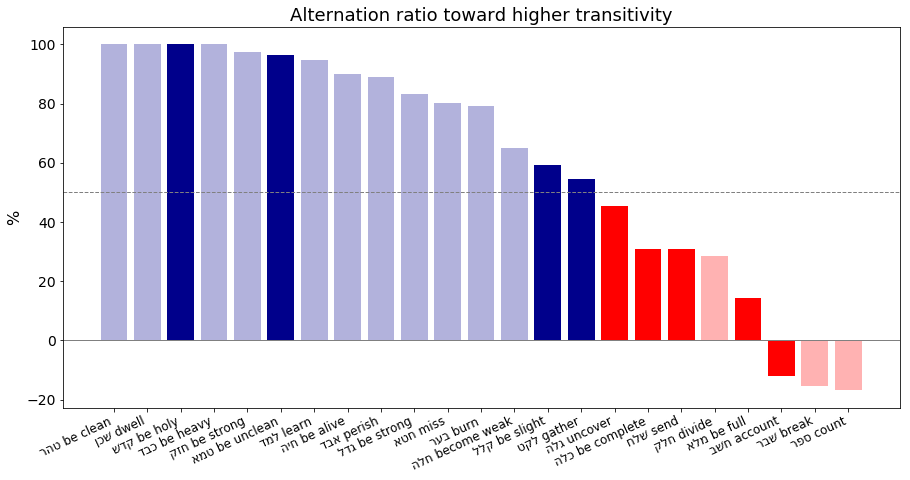

In [107]:
plotTrans(qal_piel_trans, title='Alternation ratio toward higher transitivity', threshold=50, label='comb', highlight=piel)

The image is much less clear than for the *Hiphil* stem. More than half of the verbs in question do not have a tendency toward increase of transitivity when alternating from *Qal* to *Piel*. As for the *Hiphil*, we hypothesize that lexemes with a ratio higher han 0.5 can be regarded as morphological causatives of the *Qal* correspondent, while the remaining lexemes do not share this semantic relationship. 

In [108]:
piel_causatives = list(qal_piel_trans[(qal_piel_trans.lexeme.isin(piel)) & (qal_piel_trans.total > 0.5)].index)
piel_not_causatives = list(qal_piel_trans[(qal_piel_trans.lexeme.isin(piel)) & (qal_piel_trans.total <= 0.5)].index)

#### Causative *Piel*

In [109]:
correction1 = {}

In [128]:
query = '''
book book=Leviticus
 chapter chapter=17|18|19|20|21|22|23|24|25|26
  clause
   phrase function=Pred|PreO|PreS|PreC|PtcO
    word lex={} vs=qal|piel|pual
'''

def display(lex, stem='qal|piel'):
    lex = lex[:lex.index('_')]
    results = A.search(query.format(lex))
    A.show(results)

##### QDC "be holy"

In [111]:
display(piel_causatives[0])

  1.02s 0 results


In [112]:
displayCorpus('QDC[', stem='piel', s=1, n=9)

  1.13s 40 results


The lexeme is important for this analysis because it appears in both *Qal*, *Hiphil*, and *Piel*. In most cases, the word is used in *Piel* as sanctifying, a causative event but not in the sense of a cultic activity like the *Hiphil*. In a single case in this section of Leviticus, the *Piel* is used in the declarative sense, that is, to consider something holy (Lev 21:8). For now, we retain the annotation, because that single case is an exception in this part of Leviticus.

In [113]:
query1 = '''
corpus
 clause
   phrase function=Pred|PreS|PreO|PreC|PtcO
     word lex=QDC[ vs=piel
   phrase function=Cmpl
'''

results1 = A.search(query1, sets=sets)
A.show(results1)

  1.53s 2 results


##### VM> "be unclean"

In [114]:
display(piel_causatives[1])

  1.20s 0 results


In [115]:
displayCorpus('VM>[', 'qal', n=29)

  1.34s 69 results


Generally, the *Qal* is used to express "being unclean", while the *Piel* is used to express "causing something to be unclean". There is one exception, though: In Lev 20:25 the *Piel* is used in a declarative sense "to regard (something) as unclean". For now, we consider *Piel* as causative and retain the annotations.

##### QLL "be slight"

In [129]:
display(piel_causatives[2], stem='qal|piel')

  1.11s 0 results


In [130]:
displayCorpus('QLL[', stem='qal', n=6)

  1.23s 6 results


In [131]:
query1 = '''
word lex=QLL[ vt=ptca vs=piel
'''

A.show(A.search(query1))

  0.77s 9 results


The *Piel* of QLL is a speech verb and means "to curse". It is therefore not causative and we need to change the annotation. The *Qal* can mean different things but is used for "being cursed", a stative, not causative verb:

In [132]:
correction1['QLL['] = (('qal',''),('piel',''))

##### LQV "gather"

In [133]:
display(piel_causatives[3], stem='qal|piel')

  1.23s 0 results


In [134]:
displayCorpus('LQV[', stem='piel', n=7)

  1.28s 7 results


*Qal* and *Piel* seem to be equally used for "gathering", so we can hardly retain the *Piel* as a morphological causative. By contrast, both the *Qal* and *Piel* should be considered causative.

In [135]:
correction1['LQV['] = (('qal','caus'),('piel','caus'))

#### Not causative *Piel*

Finally, we turn our attention toward *Piel* formations that are not hypothesized as morphological causatives of the *Qal*.

##### GLH "uncover"

In [136]:
display(piel_not_causatives[0], stem='qal|piel')

  1.22s 0 results


In [137]:
displayCorpus('GLH[', 'qal', s=1, n=11)

  1.27s 11 results


The verb is difficult and is used in a variety of meanings, most dominantly for "go into exile" and "uncover/open" (both *Qal*). The *Piel* is used for "uncover" or "expose" in a negative sense. In short, there is no derivable relationship in terms of causation between the two stems and they can both be used for causation.

In [138]:
correction1['GLH['] = (('qal','?'),('piel','caus'))

##### KLH "be complete"

In [139]:
display(piel_not_causatives[1], stem='qal|piel')

  1.08s 0 results


In [140]:
displayCorpus('KLH[', stem='piel', s=1, n=10)

  1.20s 74 results


In [141]:
BJT = '''
clause
  phrase function=Subj
    :: word lex=BJT/
  phrase function=Pred
    word sp=verb gn=m ps=p3 nu=sg
'''

A.show(A.search(BJT), end=5)

  2.70s 8 results


In most cases, the *Qal* is used to express "be completed" or "be full of", a stative not causative meaning. It makes sense to see the *Piel* as the causing something to be completed. In some cases, the *Piel* can also express extermination, which is also causative. We therefore need to change the annotation:

In [142]:
correction1['KLH['] = (('qal',''),('piel','caus'))

In [143]:
df_frequency[df_frequency.index.get_level_values(0) == 'KLH[_be complete']

,frame,(S),(S)-O,(S)-O-O,total
lex,stem,,,,


##### CLX "send"

In [144]:
display(piel_not_causatives[2], stem='qal|piel')

  1.11s 0 results


In [145]:
displayCorpus('CLX[', stem='piel')

  1.22s 158 results


In [146]:
query1 = '''
clause
  phrase function=Pred
    word lex=CLX[
  phrase function=Objc
    word lex=JD/
'''

A.show(A.search(query1))

  1.98s 58 results


Both *Qal* and *Piel* seem to denote some kind of transfer, therefore both causative:

In [147]:
correction1['CLX['] = (('qal','caus'),('piel','caus'))

##### ML> "be full"

In [148]:
display(piel_not_causatives[3], stem='qal|piel')

  1.00s 0 results


In [149]:
displayCorpus('ML>[', stem='hif')

  1.00s 0 results


Both *Qal* and *Piel* seem to be causative in most cases. The *Niphal* seems to express the meaning "be full" but *Qal* can also be used in this sense. If we focus on Lev 17-26, the *Piel* is clearly causative, while *Qal* is used in a non-causative sense. This annotation would not account for all cases in the larger corpus, however:

In [150]:
correction1['ML>['] = (('qal',''),('piel','caus'))

##### XCB "account"

In [151]:
display(piel_not_causatives[4], stem='qal|piel')

  0.93s 0 results


In [152]:
displayCorpus('XCB[', stem='piel', n=6)

  1.05s 6 results


The *Qal* and the *Piel* senses are different but not in terms of causativity, so we can retain the annotation.

### Summary

We can now summarize our results:

In [153]:
print(f'Number of verbs reviewed: {len(hiphil) + len(piel)}')
print(f'Number of corrections made: {len(correction) + len(correction1)}')

Number of verbs reviewed: 30
Number of corrections made: 11


What remains to be done is to combine all results and store them in a single file. Only morphological causatives are stored in order to enhance consistency. However, apart from the morphological causative itself, the non-causative correspondent and the passive equivalents of both causative and non-causative are annotated, the passive being annotated similar to its non-passive equivalent.

In [118]:
def causation(df, stem, passive, verb_list, correction, column='total'):
    
    causation_dict = collections.defaultdict()
    
    causatives = list(df[df[column] > 0.5].index)
    causatives = [getLex(lex) for lex in causatives]

    for lex in verb_list:
        if lex in correction:
            for stem, aspect in correction[lex]:
                causation_dict[f'{lex}_{stem}'] = aspect
                
        else:
            if lex in causatives:
                causation_dict[f'{lex}_qal'] = ''
                causation_dict[f'{lex}_nif'] = ''
                causation_dict[f'{lex}_{stem}'] = 'caus'
                causation_dict[f'{lex}_{passive}'] = 'caus'
    
    return causation_dict

In [119]:
hif_caus = causation(qal_hif_trans, 'hif', 'hof', hiphil, correction)
piel_caus = causation(qal_piel_trans, 'piel', 'pual', piel, correction1)

We can now combine the two dictionaries:

In [120]:
comb_df = collections.defaultdict()

for lex in hif_caus:
    comb_df[lex] = hif_caus[lex]
    
for lex in piel_caus:
    comb_df[lex] = piel_caus[lex]

In [121]:
comb_df = pd.DataFrame([comb_df]).T
comb_df.head()

,0
<BR[_hif,caus
<BR[_hof,caus
<BR[_nif,
<BR[_qal,
<LH[_hif,


In [122]:
len(comb_df)

84

In [124]:
list(comb_df.index)

['<BR[_hif',
 '<BR[_hof',
 '<BR[_nif',
 '<BR[_qal',
 '<LH[_hif',
 '<LH[_qal',
 '>BD[_hif',
 '>BD[_hof',
 '>BD[_nif',
 '>BD[_qal',
 'BW>[_hif',
 'BW>[_hof',
 'BW>[_nif',
 'BW>[_qal',
 'CBT[_hif',
 'CBT[_hof',
 'CBT[_nif',
 'CBT[_qal',
 'CWB[_hif',
 'CWB[_hof',
 'CWB[_nif',
 'CWB[_qal',
 'HLK[_hif',
 'HLK[_hof',
 'HLK[_nif',
 'HLK[_qal',
 'JCB[_hif',
 'JCB[_hof',
 'JCB[_nif',
 'JCB[_qal',
 'JLD[_hif',
 'JLD[_qal',
 'JSP[_hif',
 'JSP[_qal',
 'JY>[_hif',
 'JY>[_hof',
 'JY>[_nif',
 'JY>[_qal',
 'KRT[_hif',
 'KRT[_qal',
 'LQV[_nif',
 'LQV[_piel',
 'LQV[_pual',
 'LQV[_qal',
 'MWT[_hif',
 'MWT[_hof',
 'MWT[_nif',
 'MWT[_qal',
 'NWX[_hif',
 'NWX[_hof',
 'NWX[_nif',
 'NWX[_qal',
 'QDC[_hif',
 'QDC[_hof',
 'QDC[_nif',
 'QDC[_piel',
 'QDC[_pual',
 'QDC[_qal',
 'QLL[_nif',
 'QLL[_piel',
 'QLL[_pual',
 'QLL[_qal',
 'QRB[_hif',
 'QRB[_hof',
 'QRB[_nif',
 'QRB[_qal',
 'QWM[_hif',
 'QWM[_hof',
 'QWM[_nif',
 'QWM[_qal',
 'RBH[_hif',
 'RBH[_hof',
 'RBH[_nif',
 'RBH[_qal',
 'RWM[_hif',
 'RWM[_hof',
 'RWM[

### Export

In [91]:
comb_df.to_csv(f'{PATH}Lev17-26_morphological_causitive.csv')